### Importing Libraries

In [1]:
import numpy as np
import pandas as pd

# Import PyTorch
import torch
from torch import nn
import torch.nn.functional as F

import collections

# Import torchvision
import torchvision
from torchvision.transforms import ToTensor, Lambda
import torch.nn.init as init  # Add this import statement

# Import matplotlib for visualization
import matplotlib.pyplot as plt

In [2]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Dataset
from PIL import Image

In [3]:
data_dir = 'casting_data/'
train_path = data_dir + 'train/'
test_path = data_dir + 'test/'

In [4]:
image_shape = (300,300,1) # 300 × 300、graysclaed (full-color : 3)
batch_size = 32

# Define transformations
transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
])

# Define train and test datasets
train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

# Define data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

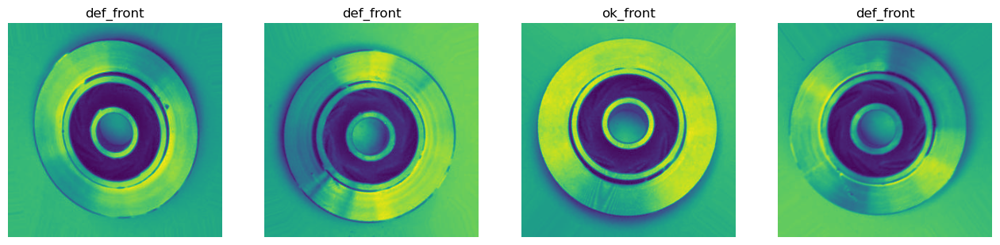

In [5]:
# Function to display images
def show_images(images, labels=None, classes=None):
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=(16, 8))
    
    for i in range(num_images):
        ax = axes[i]
        ax.imshow(np.transpose(images[i], (1, 2, 0)))
        if labels != None:
            ax.set_title(classes[labels[i]])
        ax.axis('off')

# Get a random batch of data
images, labels = next(iter(train_loader))

# Plot the images
show_images(images[:4], labels[:4], train_dataset.classes)
plt.show()

In [6]:
# How many samples are there? 
len(train_loader.dataset), len(train_loader.dataset.targets), len(test_loader.dataset), len(test_loader.dataset.targets)

(6633, 6633, 715, 715)

In [7]:
train_features_batch, train_labels_batch = next(iter(train_loader))
train_features_batch.shape, train_labels_batch.shape

(torch.Size([32, 1, 300, 300]), torch.Size([32]))

In [8]:
class_names = train_loader.dataset.classes
print("Class names:", class_names)

Class names: ['def_front', 'ok_front']


In [9]:
class_labels = []

for images, labels in train_loader:
    class_labels.extend(labels.tolist())

print("Class labels from train_loader:", class_labels)


Class labels from train_loader: [0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0

In [10]:
np.unique(class_labels)

array([0, 1])

In [11]:
class Part_Classifier_V0(nn.Module):
    def __init__(self, n_channels = 1):
        super(Part_Classifier_V0, self).__init__()
        self.conv_stack = []
        self.classifier = []
        self.layers = collections.OrderedDict()

        self.conv1 = nn.Conv2d(
            in_channels = n_channels,
            out_channels = 16,
            kernel_size = 7,
            stride = 2,
            padding = 1
        )
        init.xavier_uniform_(self.conv1.weight)  # Xavier initialization
        self.conv_stack.append(self.conv1)
        self.layers['conv1'] = self.conv1

        self.RELU1 = nn.ReLU()
        self.conv_stack.append(self.RELU1)
        self.layers['RELU1'] = self.RELU1

        self.pool1 = nn.MaxPool2d(2, 2)
        self.conv_stack.append(self.pool1)
        self.layers['pool1'] = self.pool1

        self.conv2 = nn.Conv2d(
            in_channels = 16,
            out_channels = 32,
            kernel_size = 3,
            stride = 1,
            padding = 1
        )
        init.xavier_uniform_(self.conv2.weight)  # Xavier initialization
        self.conv_stack.append(self.conv2)
        self.layers['conv2'] = self.conv2

        self.RELU2 = nn.ReLU()
        self.conv_stack.append(self.RELU2)
        self.layers['RELU2'] = self.RELU2

        self.pool2 = nn.MaxPool2d(2, 2)
        self.conv_stack.append(self.pool2)
        self.layers['pool2'] = self.pool2

        self.conv3 = nn.Conv2d(
            in_channels = 32,
            out_channels = 64,
            kernel_size = 3,
            stride = 1,
            padding = 1
        )
        init.xavier_uniform_(self.conv3.weight)  # Xavier initialization
        self.conv_stack.append(self.conv3)
        self.layers['conv3'] = self.conv3

        self.RELU3 = nn.ReLU()
        self.conv_stack.append(self.RELU3)
        self.layers['RELU3'] = self.RELU3

        self.pool3 = nn.MaxPool2d(2, 2)
        self.conv_stack.append(self.pool3)
        self.layers['pool3'] = self.pool3

        self.fc = nn.Flatten()
        self.conv_stack.append(self.fc)
        self.layers['flatten'] = self.fc

        self.feature_dims = 64 * 18 * 18
        self.fc1 = nn.Linear(self.feature_dims, 224)
        init.xavier_uniform_(self.fc1.weight)  # Xavier initialization
        self.classifier.append(self.fc1)
        self.layers['fc1'] = self.fc1

        self.fc1act = nn.ReLU()
        self.classifier.append(self.fc1act)
        self.layers['fc1act'] = self.fc1act

        self.drop = nn.Dropout(0.2)
        self.classifier.append(self.drop)
        self.layers['drop'] = self.drop
        
        self.fc2 = nn.Linear(224, 1)
        init.xavier_uniform_(self.fc2.weight)  # Xavier initialization
        self.classifier.append(self.fc2)
        self.layers['fc2'] = self.fc2


    
    def forward(self, x, start=0, end=14):
        if start <= 9: # start in self.features
            for idx, layer in enumerate(self.conv_stack[start:]):
                x = layer(x)
                if idx == end:
                    return x
            for idx, layer in enumerate(self.classifier):
                x = layer(x)
                if idx + 8 == end:
                    return x
            return torch.sigmoid(x)
        else:
            for idx, layer in enumerate(self.classifier):
                if idx >= start - 10:
                    x = layer(x)
            return torch.sigmoid(x)
                  
torch.manual_seed(42)
client, server, clone = Part_Classifier_V0(), Part_Classifier_V0(), Part_Classifier_V0()
client

Part_Classifier_V0(
  (conv1): Conv2d(1, 16, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
  (RELU1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (RELU2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (RELU3): ReLU()
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=20736, out_features=224, bias=True)
  (fc1act): ReLU()
  (drop): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=224, out_features=1, bias=True)
)

In [12]:
from torchsummary import summary
client.to('cuda')

summary(client, (1, 300, 300))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 148, 148]             800
              ReLU-2         [-1, 16, 148, 148]               0
         MaxPool2d-3           [-1, 16, 74, 74]               0
            Conv2d-4           [-1, 32, 74, 74]           4,640
              ReLU-5           [-1, 32, 74, 74]               0
         MaxPool2d-6           [-1, 32, 37, 37]               0
            Conv2d-7           [-1, 64, 37, 37]          18,496
              ReLU-8           [-1, 64, 37, 37]               0
         MaxPool2d-9           [-1, 64, 18, 18]               0
          Flatten-10                [-1, 20736]               0
           Linear-11                  [-1, 224]       4,645,088
             ReLU-12                  [-1, 224]               0
          Dropout-13                  [-1, 224]               0
           Linear-14                   

In [13]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [14]:
client_opt = torch.optim.Adam(client.parameters(), lr=0.001, amsgrad=True)
server_opt = torch.optim.Adam(server.parameters(), lr=0.001, amsgrad=True)
criterion = nn.BCELoss()
client.to(device)
server.to(device)
clone.to(device)

Part_Classifier_V0(
  (conv1): Conv2d(1, 16, kernel_size=(7, 7), stride=(2, 2), padding=(1, 1))
  (RELU1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (RELU2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (RELU3): ReLU()
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=20736, out_features=224, bias=True)
  (fc1act): ReLU()
  (drop): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=224, out_features=1, bias=True)
)

In [15]:
def calculate_binary_accuracy(m1,m2, test_loader, split_layer):
    m1.eval()  # Set the model to evaluation mode
    m2.eval()  # Set the model to evaluation mode
    correct_predictions = 0
    total_samples = 0

    with torch.no_grad():  # Disable gradient calculation during inference
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            # Perform inference
            outputs = m1(m2(images, end=split_layer), start=split_layer+1)
            predictions = torch.sigmoid(outputs) > 0.5  # Apply threshold for binary classification

            # Count correct predictions
            correct_predictions += (predictions == labels.unsqueeze(1)).sum().item()

            # Update total number of samples
            total_samples += labels.size(0)

    # Calculate accuracy
    accuracy = (correct_predictions / total_samples) * 100

    return accuracy

In [16]:
# Initiating empty arrays for storing losses and accuracy
Acc = []
Losses = []

In [19]:
# Run this line of code when we reached a bottleneck in accuracy
client_opt = torch.optim.Adam(client.parameters(), lr=0.0001, amsgrad=True)
server_opt = torch.optim.Adam(server.parameters(), lr=0.0001, amsgrad=True)

In [21]:
epochs = 10
split_layer = 4

for epoch in range(epochs):
    running_loss = 0
    for images, labels in train_loader:
        server_opt.zero_grad()
        client_opt.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        pred = server(client(images, end=split_layer), start=split_layer+1)
        pred_sq = pred.squeeze()
        loss = criterion(pred_sq, labels.float())
        loss.backward()
        running_loss += loss

        server_opt.step()
        client_opt.step()
    else:
        Acc.append(calculate_binary_accuracy(server,client,test_loader=test_loader, split_layer=split_layer))
        Losses.append(running_loss)
        print(f'Epoch: {epoch} Loss: {running_loss / len(train_loader)} Acc: {Acc[-1]}')
        

Epoch: 0 Loss: 0.0006696710479445755 Acc: 90.62937062937063
Epoch: 1 Loss: 0.00043650722363963723 Acc: 82.23776223776224
Epoch: 2 Loss: 0.0005332170985639095 Acc: 83.07692307692308
Epoch: 3 Loss: 0.00044583651470020413 Acc: 87.27272727272727
Epoch: 4 Loss: 0.000452822947409004 Acc: 81.25874125874127
Epoch: 5 Loss: 0.0006305317510850728 Acc: 86.15384615384616
Epoch: 6 Loss: 0.00032732548424974084 Acc: 87.83216783216783
Epoch: 7 Loss: 0.0010968021815642715 Acc: 85.17482517482517
Epoch: 8 Loss: 0.00042437168303877115 Acc: 86.7132867132867
Epoch: 9 Loss: 0.0002980218268930912 Acc: 84.33566433566433


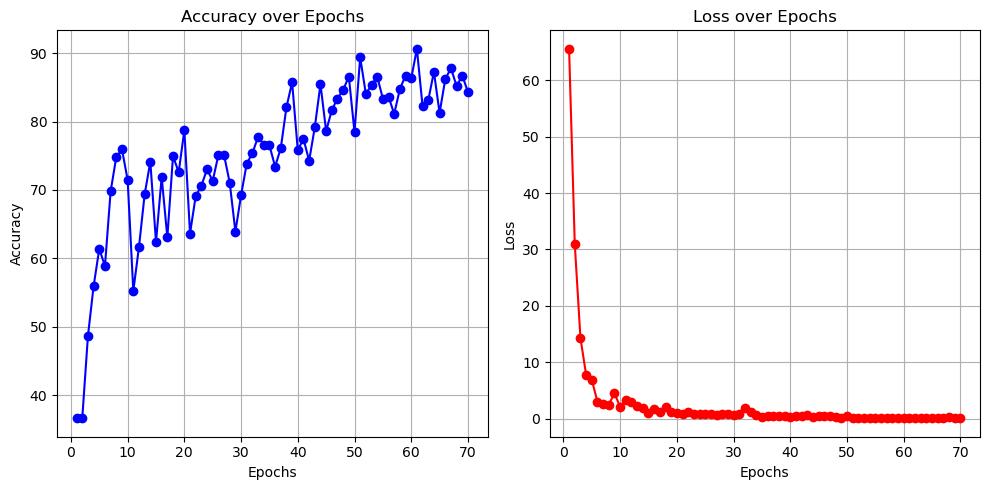

In [22]:
epochs = range(1, (len(Acc)+1))
losses_numpy = [loss.to('cpu').detach().numpy() for loss in Losses]
losses_numpy_array = np.array(losses_numpy)
# Plot accuracy
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, Acc, marker='o', color='b')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs, losses_numpy_array, marker='o', color='r')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)

plt.tight_layout()
plt.show()

In [23]:
calculate_binary_accuracy(server,client,test_loader=train_loader, split_layer=split_layer) #Train Acc

83.86853610734207

In [24]:
# computes total variation for an image
def TV(x):
    batch_size = x.size()[0]
    h_x = x.size()[2]
    w_x = x.size()[3]
    count_h = _tensor_size(x[:, :, 1:, :])
    count_w = _tensor_size(x[:, :, :, 1:])
    h_tv = torch.pow(x[:, :, 1:, :] - x[:, :, :h_x - 1, :], 2).sum()
    w_tv = torch.pow(x[:, :, :, 1:] - x[:, :, :, :w_x - 1], 2).sum()
    return (h_tv / count_h + w_tv / count_w) / batch_size


def l2loss(x):
    return (x ** 2).mean()


def _tensor_size(t):
    return t.size()[1] * t.size()[2] * t.size()[3]

def model_inversion_stealing(clone_model, split_layer, target, input_size, 
                            lambda_tv=1, lambda_l2=1, main_iters=1000, input_iters=100, model_iters=100):
    x_pred = torch.empty(input_size).fill_(0.5).to(device).requires_grad_(True)
    input_opt = torch.optim.Adam([x_pred], lr=0.001, amsgrad=True)
    model_opt = torch.optim.Adam(clone_model.parameters(), lr=0.001, amsgrad=True)
    mse = torch.nn.MSELoss()

    for main_iter in range(main_iters):
        for input_iter in range(input_iters):
            input_opt.zero_grad()
            pred = clone_model(x_pred, end=split_layer)
            loss = mse(pred, target) + lambda_tv*TV(x_pred) + lambda_l2*l2loss(x_pred)
            loss.backward(retain_graph=True)
            input_opt.step()
        for model_iter in range(model_iters):
            model_opt.zero_grad()
            pred = clone_model(x_pred, end=split_layer)
            loss = mse(pred, target) 
            loss.backward(retain_graph=True)
            model_opt.step()

    return x_pred.detach()

def display_imagelist(images, height, width):
    fig, ax = plt.subplots(1, len(images))
    for index, image in enumerate(images):
        ax[index].axis('off')
        ax[index].imshow(image)
    plt.show()

def get_examples_by_class(dataset, target, count=1):
    result = []
    for image, label in dataset:
        if label == target:
            if count == 1:
                return image
            result.append(image)
        if len(result) == count:
            break
    return result

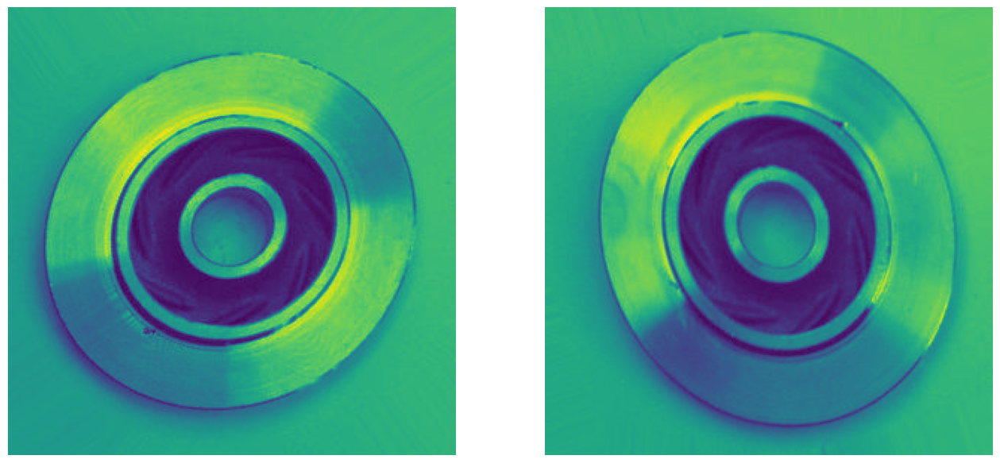

In [25]:
COUNT = 2

inversion_targets= [get_examples_by_class(test_dataset, c, count=COUNT) for c in range(2)]
targetloader = torch.utils.data.DataLoader(inversion_targets, shuffle=False)
mse = torch.nn.MSELoss()

# Plot the images
show_images((inversion_targets[0][0:]))
plt.show()

In [26]:
from torch.utils.data import Subset, DataLoader
# Get indices of the first 5 images for each class
indices = []
for class_label in range(len(test_dataset.classes)):
    class_indices = [idx for idx, (image, label) in enumerate(test_dataset.imgs) if label == class_label]
    indices.extend(class_indices[:1])

# Create a subset containing the selected images
target_dataset = Subset(test_dataset, indices)

# Create a DataLoader for the target dataset
target_loader = DataLoader(target_dataset, batch_size=1, shuffle=True)

# Example usage to iterate over the images and labels in the target loader
for image, label in target_loader:
    # Process each image and label as needed
    print("Label:", label.item())
    # Assuming image is a tensor, you can perform further processing here

Label: 0
Label: 1


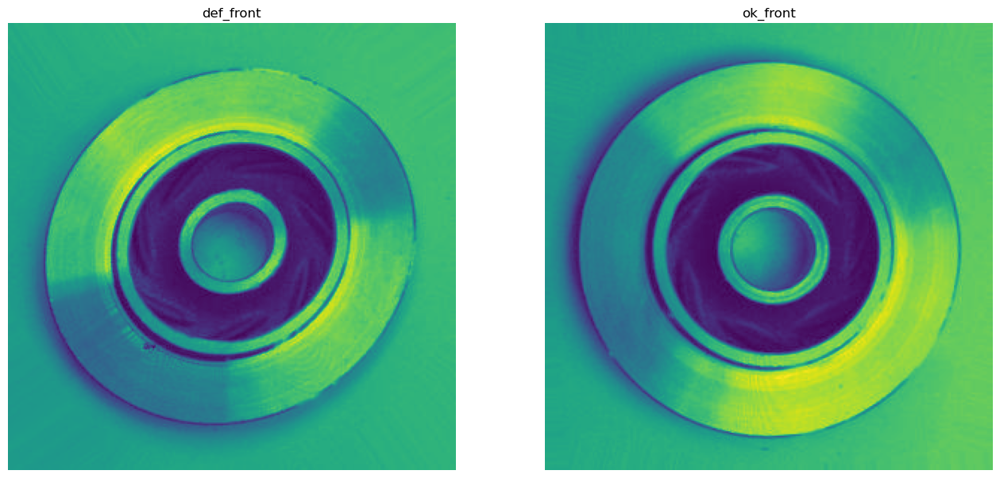

In [27]:
inversion_targets = []
inversion_labels = []
for i in range(len(target_dataset)):
    image, label = target_dataset[i]
    inversion_targets.append(image)
    inversion_labels.append(label)
show_images(inversion_targets,inversion_labels,test_dataset.classes)

In [28]:
results, losses = [], []
results_array = []

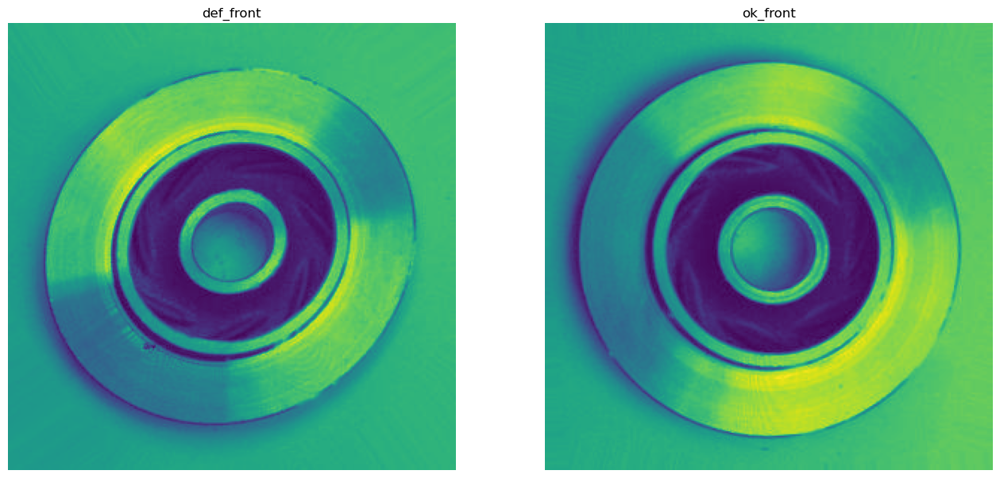

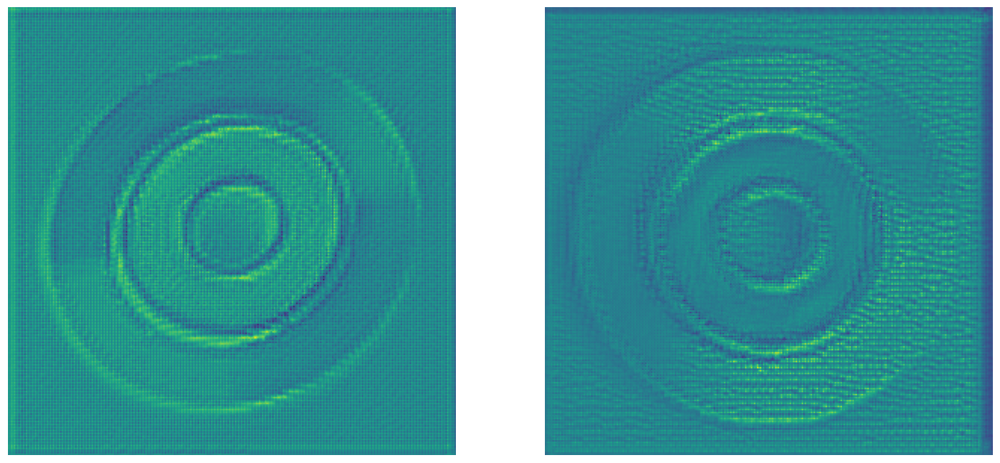

In [29]:
results, losses = [], []
for target, label in (targetloader):
    target = target.to(device)
    # obtain client output
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=100, input_iters=100, model_iters=100)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results]
results_array.append([result.to('cpu') for result in results])
show_images(results_array[0])

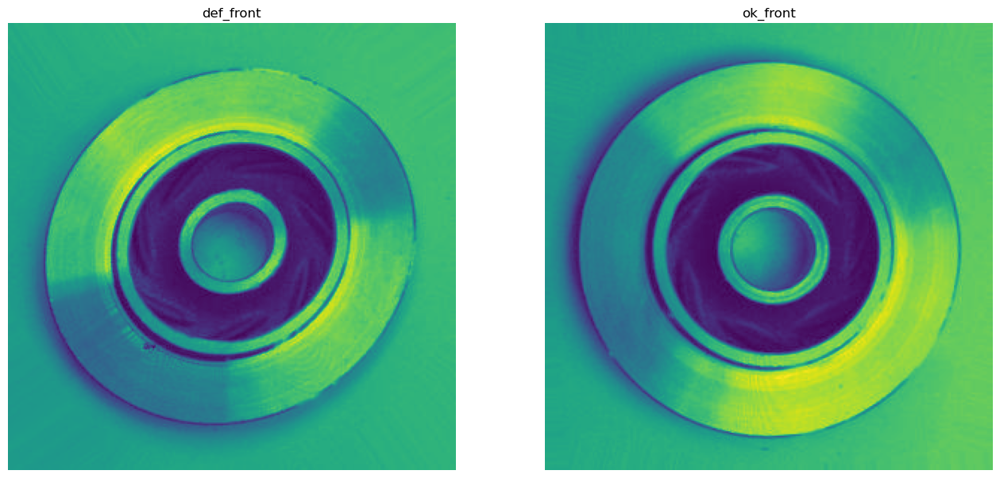

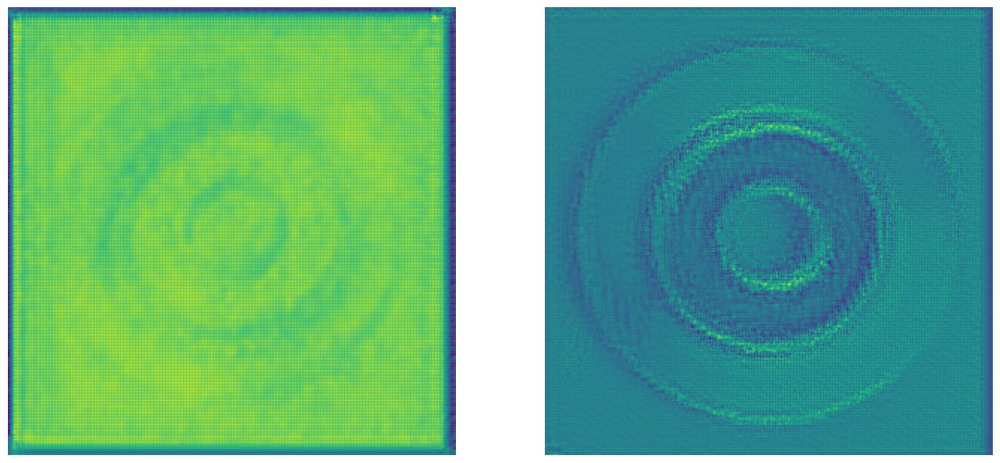

In [30]:
for target, label in (targetloader):
    # obtain client output
    target = target.to(device)
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=1000, input_iters=100, model_iters=100)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results[-2:]]
results_array.append([result.to('cpu') for result in results[-2:]])
show_images(results_array[1])

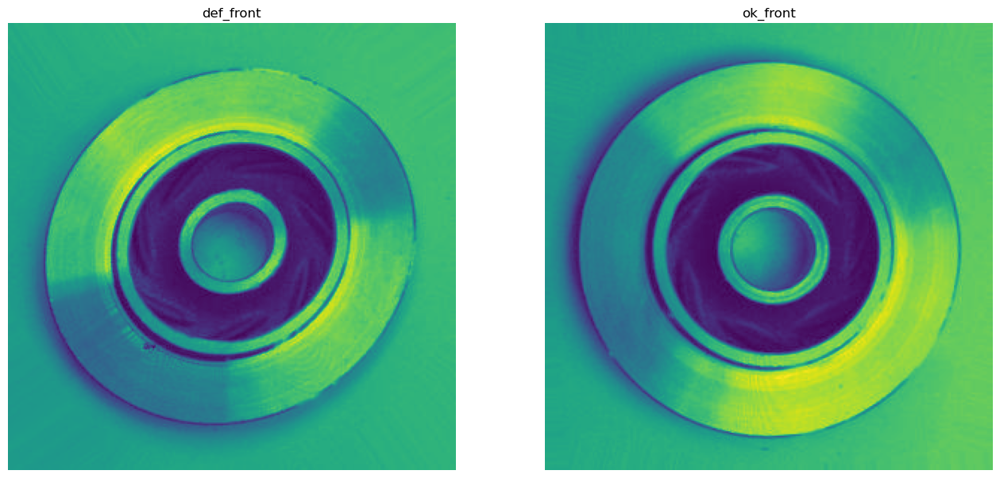

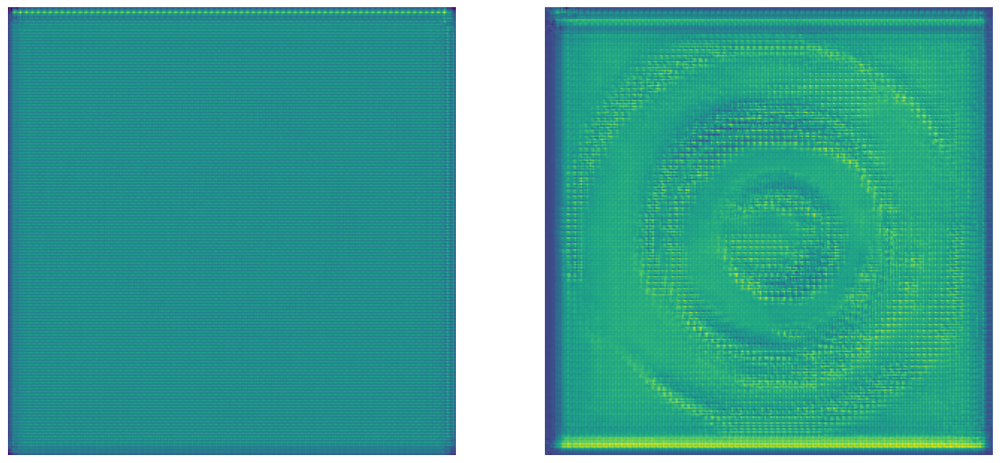

In [31]:
for target, label in (targetloader):
    # obtain client output
    target = target.to(device)
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=100, input_iters=200, model_iters=100)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results[-2:]]
results_array.append([result.to('cpu') for result in results[-2:]])
show_images(results_array[2])

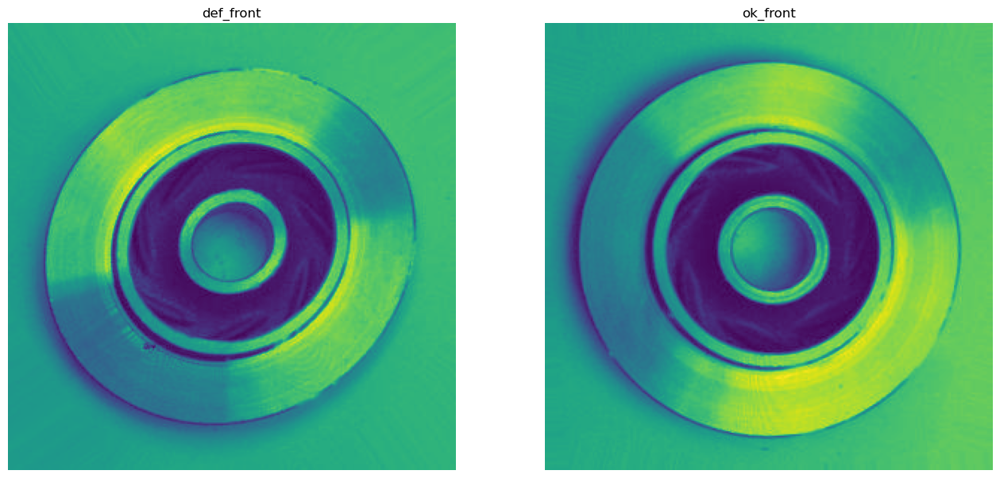

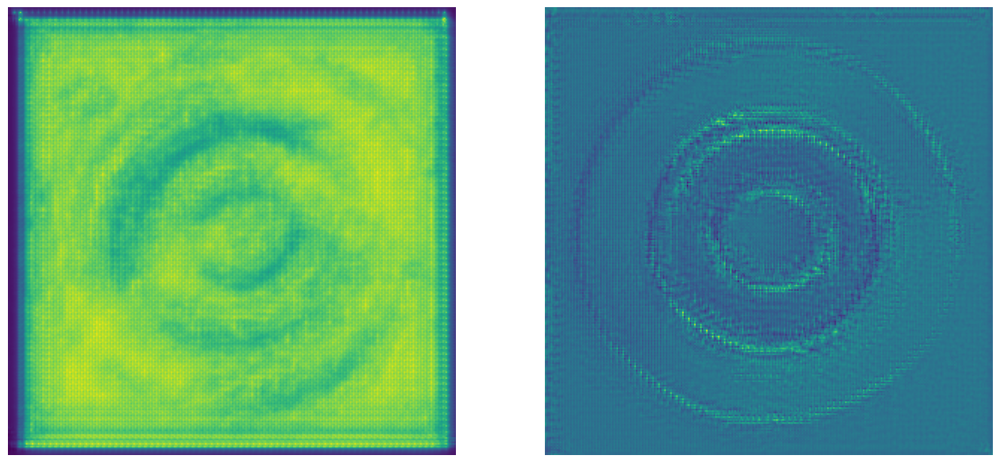

In [32]:
for target, label in (targetloader):
    # obtain client output
    target = target.to(device)
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=100, input_iters=100, model_iters=200)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results[-2:]]
results_array.append([result.to('cpu') for result in results[-2:]])
show_images(results_array[3])

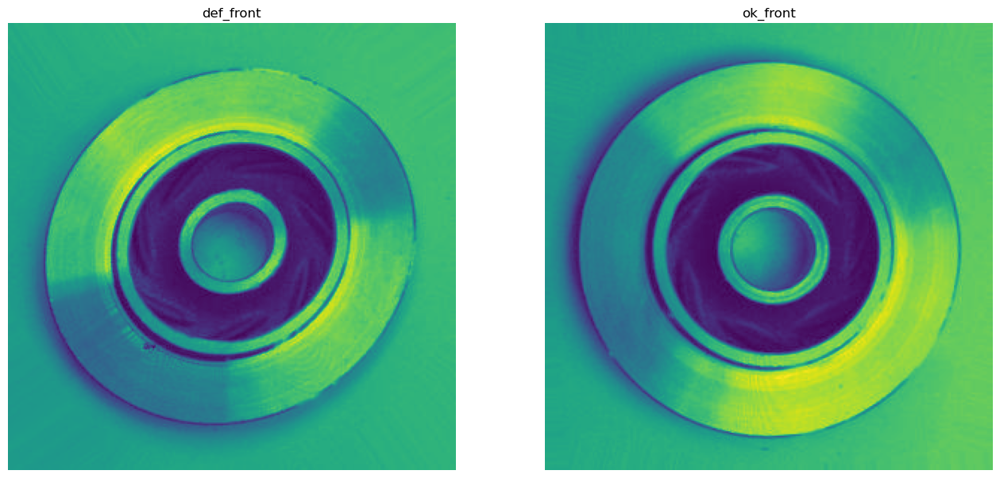

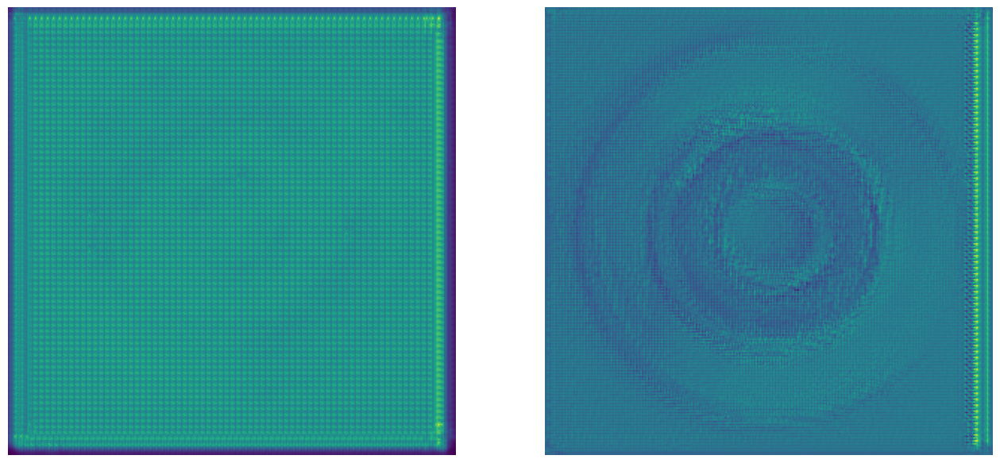

In [33]:
for target, label in (targetloader):
    # obtain client output
    target = target.to(device)
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=100, input_iters=100, model_iters=400)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results[-2:]]
results_array.append([result.to('cpu') for result in results[-2:]])
show_images(results_array[4])

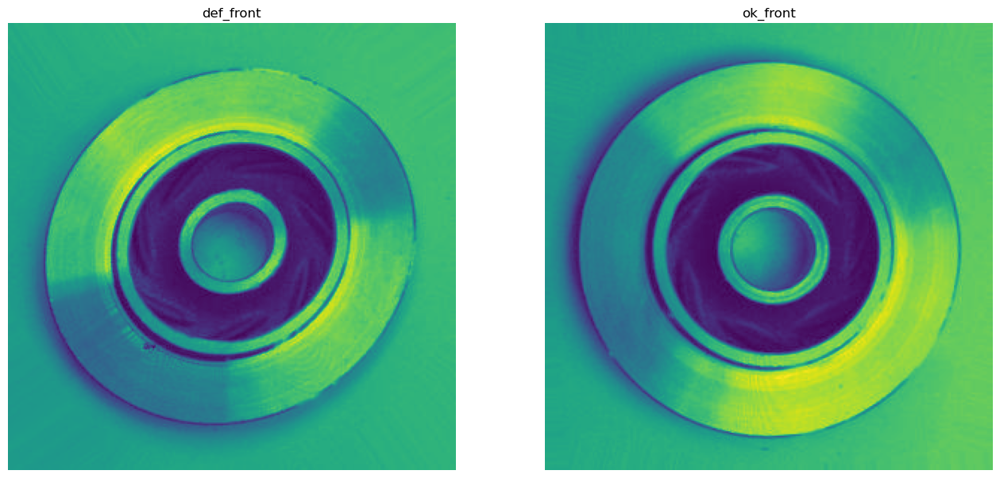

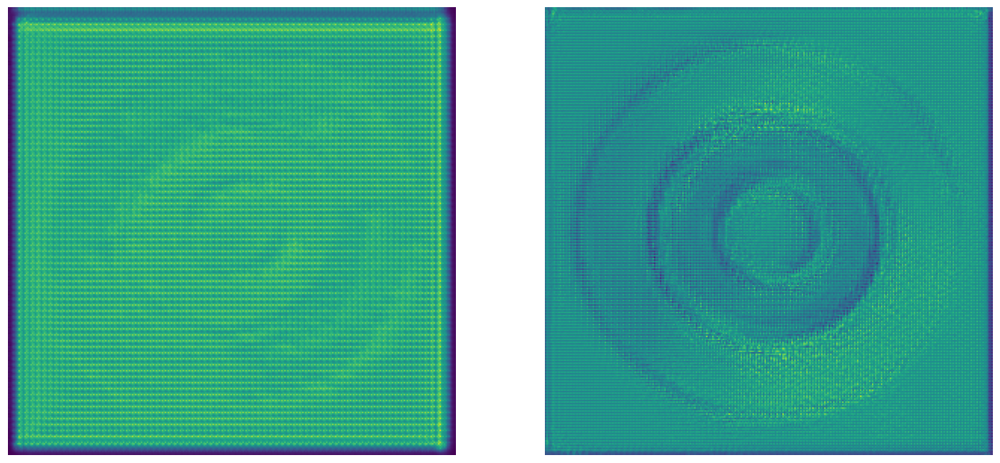

In [34]:
for target, label in (targetloader):
    # obtain client output
    target = target.to(device)
    client_out = client(target, end=split_layer)

    # perform the attack
    result = model_inversion_stealing(clone, split_layer, client_out, target.size() ,main_iters=100, input_iters=100, model_iters=800)

    # save result
    results.append(result)
    loss = mse(result, target)
    losses.append(loss)


show_images(inversion_targets, inversion_labels, test_dataset.classes)
results = [tensor.squeeze(0) for tensor in results[-2:]]
results_array.append([result.to('cpu') for result in results[-2:]])
show_images(results_array[5])

In [35]:
losses

[tensor(0.3261, device='cuda:0'),
 tensor(0.3477, device='cuda:0'),
 tensor(0.3250, device='cuda:0'),
 tensor(0.3528, device='cuda:0'),
 tensor(0.1004, device='cuda:0'),
 tensor(0.3240, device='cuda:0'),
 tensor(0.2957, device='cuda:0'),
 tensor(0.3548, device='cuda:0'),
 tensor(0.1638, device='cuda:0'),
 tensor(0.3535, device='cuda:0'),
 tensor(0.2092, device='cuda:0'),
 tensor(0.3505, device='cuda:0')]

In [36]:
# Calculate the sum of all values
total_sum = sum(tensor.item() for tensor in losses)

# Calculate the average
average = total_sum / len(losses)

print("Average:", average)

Average: 0.29196226969361305
